In [70]:
import pandas as pd
import numpy as np
import altair as alt
%matplotlib inline

In [71]:
s4_july_df = pd.read_csv('/Volumes/CurtData/Terra-Ref-2020/Ryan-analysis/mldat_july1.csv')

In [72]:
s4_july_df.describe()

,range,column,planter_seed_drop,seedling_emergence_rate,emergence_count,canopy_height,canopy_height_diff,leaf_angle_mean,leaf_angle_mean_slope,leaf_angle_chi,...,plant_basal_tiller_number,stem_elongated_internodes_number_slope,canopy_cover,stand_count,stalk_diameter_minor_axis,stalk_diameter_major_axis,leaf_width,leaf_length,leaf_desiccation_present,aboveground_dry_biomass
count,847.000000,847.000000,699.000000,70.000000,70.000000,728.00000,728.000000,751.000000,701.000000,751.000000,...,35.000000,30.000000,108.000000,699.000000,36.000000,36.000000,35.000000,35.000000,698.000000,703.000000
mean,27.969303,8.508855,66.057225,0.818066,56.494524,205.45261,11.846154,0.403221,0.000193,1.985950,...,3.464286,0.284574,42.911111,25.500715,10.790972,15.430602,69.400658,778.753288,0.030946,22336.724040
std,15.288989,4.608000,12.652435,0.164984,13.477803,52.31193,2.863693,0.029012,0.001774,0.144641,...,0.747896,0.053114,10.593915,2.974160,1.763419,1.679236,8.537537,76.906153,0.125235,9681.393585
min,2.000000,1.000000,0.000000,0.376500,19.000000,56.00000,1.500000,0.337219,-0.005747,1.501085,...,2.000000,0.202672,21.500000,12.000000,8.460000,12.400000,51.428571,667.142857,0.000000,1137.000000
25%,15.000000,5.000000,62.000000,0.725562,50.781250,163.75000,11.083333,0.381858,-0.000872,1.902129,...,3.000000,0.250106,35.187500,24.000000,9.175000,14.360000,66.527778,726.666667,0.000000,15725.000000
50%,28.000000,9.000000,68.500000,0.829937,59.500000,214.00000,12.000000,0.399905,-0.000040,1.991410,...,3.333333,0.265738,41.850000,25.000000,10.670000,15.105000,69.166667,768.333333,0.000000,21870.000000
75%,41.000000,12.500000,73.500000,0.917312,65.187500,247.00000,12.000000,0.421267,0.001161,2.080978,...,4.000000,0.309868,50.162500,27.000000,12.165000,16.710000,74.222222,835.833333,0.000000,28135.000000
max,54.000000,16.000000,88.500000,1.191250,77.400000,357.00000,32.083333,0.511659,0.009087,2.682848,...,5.000000,0.383402,68.600000,33.500000,15.400000,18.680000,88.533333,995.333333,1.000000,61030.000000


In [73]:
s4_july_df.dtypes

sitename2                                  object
range                                       int64
column                                      int64
planter_seed_drop                         float64
seedling_emergence_rate                   float64
emergence_count                           float64
canopy_height                             float64
canopy_height_diff                        float64
leaf_angle_mean                           float64
leaf_angle_mean_slope                     float64
leaf_angle_chi                            float64
leaf_angle_chi_slope                      float64
leaf_angle_beta                           float64
leaf_angle_beta_slope                     float64
leaf_angle_alpha                          float64
leaf_angle_alpha_slope                    float64
plant_basal_tiller_number                 float64
stem_elongated_internodes_number_slope    float64
canopy_cover                              float64
stand_count                               float64


In [74]:
def returnUniqueCounts(dframe):
    return pd.DataFrame.from_records([(col, dframe[col].nunique()) for col in dframe.columns],
                          columns=['Column_Name', 'Num_Unique']).sort_values(by=['Num_Unique'])

In [75]:
returnUniqueCounts(s4_july_df)

,Column_Name,Num_Unique
24,leaf_desiccation_present,6
16,plant_basal_tiller_number,12
7,canopy_height_diff,12
2,column,16
17,stem_elongated_internodes_number_slope,30
22,leaf_width,32
23,leaf_length,33
21,stalk_diameter_major_axis,34
20,stalk_diameter_minor_axis,36
19,stand_count,38


It looks like there are a few rows there the final dry_biomass wasn't declared.  Lets try to find these rows and remove them, so we have a valid testing dataset.

In [76]:
# generate a mask showing which rows in the dataframe have valid target values
biomass_notna = s4_july_df['aboveground_dry_biomass'].notna()
# now generate a filtered dataframe with that condition, so the target is always defined
drop_target_na = s4_july_df.loc[biomass_notna]
# 
print('the original df had this many rows:',biomass_notna.shape[0])
print('shape after dropping undefined biomass entries:',drop_target_na.shape)
print('so we dropped',biomass_notna.shape[0]-drop_target_na.shape[0],' missing target values')

the original df had this many rows: 847
shape after dropping undefined biomass entries: (703, 26)
so we dropped 144  missing target values


In [77]:
drop_target_na.head()

,sitename2,range,column,planter_seed_drop,seedling_emergence_rate,emergence_count,canopy_height,canopy_height_diff,leaf_angle_mean,leaf_angle_mean_slope,...,plant_basal_tiller_number,stem_elongated_internodes_number_slope,canopy_cover,stand_count,stalk_diameter_minor_axis,stalk_diameter_major_axis,leaf_width,leaf_length,leaf_desiccation_present,aboveground_dry_biomass
0,MAC Field Scanner Season 4 Range 8 Column 8,8,8,73.0,NaN,NaN,166.0,11.083333,0.389411,-0.000311,...,NaN,NaN,NaN,22.0,NaN,NaN,NaN,NaN,0.0,15460.0
1,MAC Field Scanner Season 4 Range 8 Column 9,8,9,76.0,NaN,NaN,207.0,11.083333,0.362101,NaN,...,NaN,NaN,NaN,25.0,NaN,NaN,NaN,NaN,0.0,34810.0
2,MAC Field Scanner Season 4 Range 8 Column 10,8,10,54.0,0.3765,19.0,181.0,4.083333,0.395454,-0.000399,...,NaN,NaN,27.40,17.5,NaN,NaN,NaN,NaN,0.0,7531.0
3,MAC Field Scanner Season 4 Range 8 Column 12,8,12,61.0,NaN,NaN,174.0,15.500000,0.421522,NaN,...,NaN,NaN,NaN,22.5,NaN,NaN,NaN,NaN,0.2,25720.0
4,MAC Field Scanner Season 4 Range 9 Column 3,9,3,35.5,NaN,NaN,126.0,15.500000,0.402537,0.000714,...,3.5,0.233679,37.95,24.5,8.92,14.36,66.5,786.666667,0.0,18450.0


make a dataframe of just the columns we need to train on (remove the sitename, range, column, biomass).  We do this by making a list of columns to drop, then iterating through the source dataframe columns and only putting them in the list if the column is not a match with a "column to drop".  Then we can pass this list as an argument to the source dataframe to make our training dataframe with a subset of columns.

In [78]:

colsToDrop = ['sitename2','range','column','aboveground_dry_biomass']
colsLeft = [(x) for x in drop_target_na.columns if (x not in colsToDrop)]
print(colsLeft)
train_df_na = drop_target_na[colsLeft]
print(train_df_na.shape)

['planter_seed_drop', 'seedling_emergence_rate', 'emergence_count', 'canopy_height', 'canopy_height_diff', 'leaf_angle_mean', 'leaf_angle_mean_slope', 'leaf_angle_chi', 'leaf_angle_chi_slope', 'leaf_angle_beta', 'leaf_angle_beta_slope', 'leaf_angle_alpha', 'leaf_angle_alpha_slope', 'plant_basal_tiller_number', 'stem_elongated_internodes_number_slope', 'canopy_cover', 'stand_count', 'stalk_diameter_minor_axis', 'stalk_diameter_major_axis', 'leaf_width', 'leaf_length', 'leaf_desiccation_present']
(703, 22)


In [79]:
train_df_na.head()

,planter_seed_drop,seedling_emergence_rate,emergence_count,canopy_height,canopy_height_diff,leaf_angle_mean,leaf_angle_mean_slope,leaf_angle_chi,leaf_angle_chi_slope,leaf_angle_beta,...,leaf_angle_alpha_slope,plant_basal_tiller_number,stem_elongated_internodes_number_slope,canopy_cover,stand_count,stalk_diameter_minor_axis,stalk_diameter_major_axis,leaf_width,leaf_length,leaf_desiccation_present
0,73.0,NaN,NaN,166.0,11.083333,0.389411,-0.000311,2.040691,0.004837,1.817470,...,-0.037085,NaN,NaN,NaN,22.0,NaN,NaN,NaN,NaN,0.0
1,76.0,NaN,NaN,207.0,11.083333,0.362101,NaN,2.109844,NaN,2.343672,...,NaN,NaN,NaN,NaN,25.0,NaN,NaN,NaN,NaN,0.0
2,54.0,0.3765,19.0,181.0,4.083333,0.395454,-0.000399,1.977792,0.003042,1.978002,...,-0.007947,NaN,NaN,27.40,17.5,NaN,NaN,NaN,NaN,0.0
3,61.0,NaN,NaN,174.0,15.500000,0.421522,NaN,1.900032,NaN,1.864959,...,NaN,NaN,NaN,NaN,22.5,NaN,NaN,NaN,NaN,0.2
4,35.5,NaN,NaN,126.0,15.500000,0.402537,0.000714,1.937274,-0.002640,2.110941,...,-0.016646,3.5,0.233679,37.95,24.5,8.92,14.36,66.5,786.666667,0.0


**temporarily remove NaNs by filling with mean values.  This is a fudge.  the xgboost implementation of XGBoost is supposed to be tolerant of NAs, but scikit-learns is not**

In [80]:
train_df = train_df_na.fillna(train_df_na.mean())

In [81]:
train_df.head()

,planter_seed_drop,seedling_emergence_rate,emergence_count,canopy_height,canopy_height_diff,leaf_angle_mean,leaf_angle_mean_slope,leaf_angle_chi,leaf_angle_chi_slope,leaf_angle_beta,...,leaf_angle_alpha_slope,plant_basal_tiller_number,stem_elongated_internodes_number_slope,canopy_cover,stand_count,stalk_diameter_minor_axis,stalk_diameter_major_axis,leaf_width,leaf_length,leaf_desiccation_present
0,73.0,0.813284,56.501741,166.0,11.083333,0.389411,-0.000311,2.040691,0.004837,1.817470,...,-0.037085,3.477941,0.281489,42.946154,22.0,10.807857,15.435048,69.324206,781.118581,0.0
1,76.0,0.813284,56.501741,207.0,11.083333,0.362101,0.000214,2.109844,0.002102,2.343672,...,-0.015306,3.477941,0.281489,42.946154,25.0,10.807857,15.435048,69.324206,781.118581,0.0
2,54.0,0.376500,19.000000,181.0,4.083333,0.395454,-0.000399,1.977792,0.003042,1.978002,...,-0.007947,3.477941,0.281489,27.400000,17.5,10.807857,15.435048,69.324206,781.118581,0.0
3,61.0,0.813284,56.501741,174.0,15.500000,0.421522,0.000214,1.900032,0.002102,1.864959,...,-0.015306,3.477941,0.281489,42.946154,22.5,10.807857,15.435048,69.324206,781.118581,0.2
4,35.5,0.813284,56.501741,126.0,15.500000,0.402537,0.000714,1.937274,-0.002640,2.110941,...,-0.016646,3.500000,0.233679,37.950000,24.5,8.920000,14.360000,66.500000,786.666667,0.0


Pick the target column values to be the Y variable in the model training process

In [82]:
target_df = drop_target_na['aboveground_dry_biomass']
target_df.head()

0    15460.0
1    34810.0
2     7531.0
3    25720.0
4    18450.0
Name: aboveground_dry_biomass, dtype: float64

In [83]:
X_train = train_df.values
y_train = target_df.values
print(X_train.shape)
print(y_train.shape)

(703, 22)
(703,)


In [84]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn import svm
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler
#import xgboost

tree = DecisionTreeRegressor(max_depth=8).fit(X_train, y_train)
linear_reg = LinearRegression().fit(X_train, y_train)
#svm_mod = svm.SVR().fit(X_train, y_train)
gbr_mod = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=8, random_state=0, loss='ls').fit(X_train, y_train)

pred_tree = tree.predict(X_train)
pred_lr = linear_reg.predict(X_train)
#pred_svm = svm_mod.predict(X_train)
pred_gbr = gbr_mod.predict(X_train)


In [85]:
result = train_df
result['aboveground_dry_biomass'] = drop_target_na['aboveground_dry_biomass']
result['range'] = drop_target_na['range']
result['column'] = drop_target_na['column']
result['decision_tree'] = pred_tree
result['linearRegression'] = pred_lr
#cdf['svm'] = pred_svm
result['gboost'] = pred_gbr
result.head()

,planter_seed_drop,seedling_emergence_rate,emergence_count,canopy_height,canopy_height_diff,leaf_angle_mean,leaf_angle_mean_slope,leaf_angle_chi,leaf_angle_chi_slope,leaf_angle_beta,...,stalk_diameter_major_axis,leaf_width,leaf_length,leaf_desiccation_present,aboveground_dry_biomass,range,column,decision_tree,linearRegression,gboost
0,73.0,0.813284,56.501741,166.0,11.083333,0.389411,-0.000311,2.040691,0.004837,1.817470,...,15.435048,69.324206,781.118581,0.0,15460.0,8,8,21105.886598,23000.731755,16379.739671
1,76.0,0.813284,56.501741,207.0,11.083333,0.362101,0.000214,2.109844,0.002102,2.343672,...,15.435048,69.324206,781.118581,0.0,34810.0,8,9,23709.032258,20607.887347,33844.413123
2,54.0,0.376500,19.000000,181.0,4.083333,0.395454,-0.000399,1.977792,0.003042,1.978002,...,15.435048,69.324206,781.118581,0.0,7531.0,8,10,8472.000000,19803.294375,8212.115896
3,61.0,0.813284,56.501741,174.0,15.500000,0.421522,0.000214,1.900032,0.002102,1.864959,...,15.435048,69.324206,781.118581,0.2,25720.0,8,12,26347.269663,23163.133671,26086.735611
4,35.5,0.813284,56.501741,126.0,15.500000,0.402537,0.000714,1.937274,-0.002640,2.110941,...,14.360000,66.500000,786.666667,0.0,18450.0,9,3,20014.166667,11992.636777,18312.627005


In [86]:

alt.Chart(result,title="Histogram of dry biomass ground truth").mark_bar().encode(
    alt.X("aboveground_dry_biomass:Q", bin=True),
    y='count()'
)

alt.Chart(...)

In [87]:
alt.Chart(result.reset_index(),title="show the size of the tuples in date order").mark_bar().encode(
    alt.Y("aboveground_dry_biomass:Q"),
    alt.X('index:T')
)

alt.Chart(...)

It seems unusual to see the gap in values, but I assume this is because we masked away when the biomass as NaN earlier.  Lets compare with the original dataframe, before we masked away the NAs.

In [88]:
alt.Chart(s4_july_df.reset_index(),title="show the size of the tuples in date order").mark_bar().encode(
    alt.Y("aboveground_dry_biomass:Q"),
    alt.X('index:T'),
    tooltip=[
        alt.Tooltip('aboveground_dry_biomass', title='biomass'),
        alt.Tooltip('index',title='index'),
    ]
)

alt.Chart(...)

In [89]:
result.iloc[340:350]

,planter_seed_drop,seedling_emergence_rate,emergence_count,canopy_height,canopy_height_diff,leaf_angle_mean,leaf_angle_mean_slope,leaf_angle_chi,leaf_angle_chi_slope,leaf_angle_beta,...,stalk_diameter_major_axis,leaf_width,leaf_length,leaf_desiccation_present,aboveground_dry_biomass,range,column,decision_tree,linearRegression,gboost
346,78.5,0.813284,56.501741,206.0,11.083333,0.394632,0.000214,1.976493,0.002102,2.161845,...,15.435048,69.324206,781.118581,0.0,22850.0,30,13,23709.032258,22208.015809,23600.480165
347,60.0,0.813284,56.501741,111.5,4.083333,0.417359,-0.000785,1.928307,0.009153,1.788627,...,15.435048,69.324206,781.118581,0.0,11110.0,20,3,11110.000000,13180.775842,10984.027981
349,75.5,0.813284,56.501741,91.0,11.083333,0.399132,0.001024,1.980548,-0.001794,2.040447,...,15.435048,69.324206,781.118581,0.0,12940.0,30,9,12655.000000,19391.910593,12911.062109
350,74.5,0.466375,34.000000,225.0,12.000000,0.354083,0.000531,2.270141,0.003558,1.867131,...,15.040000,69.324206,781.118581,0.0,12780.0,10,4,21105.886598,15707.275197,12865.370905
351,72.5,0.946250,67.750000,216.0,12.000000,0.433295,0.001773,1.802936,-0.004461,1.929185,...,15.160000,72.555556,716.666667,0.0,16680.0,50,6,21105.886598,23552.387233,16725.377097
352,46.0,0.604625,26.800000,202.0,12.000000,0.403044,0.000071,2.013322,0.004583,1.874227,...,15.220000,60.444444,776.666667,0.0,37240.0,21,8,26347.269663,23832.539864,36713.739199
353,72.5,0.813284,56.501741,174.0,12.000000,0.380318,0.002325,2.022063,-0.007689,2.203332,...,15.435048,69.324206,781.118581,0.0,9948.0,46,14,15974.111111,18788.467524,10525.218173
354,70.0,0.813284,56.501741,221.0,12.000000,0.361301,-0.000898,2.176292,0.005804,2.052283,...,15.435048,69.324206,781.118581,0.0,20730.0,29,11,23709.032258,20697.827003,20837.548768
411,46.0,0.813284,56.501741,78.0,11.083333,0.355667,-0.001490,2.226457,0.014472,1.997915,...,15.435048,69.324206,781.118581,0.0,3696.0,20,6,3696.000000,17422.641228,3894.573567
416,71.5,0.788625,58.750000,229.0,4.083333,0.385629,0.000214,2.039184,0.002102,1.963595,...,14.360000,51.428571,667.142857,0.0,25830.0,30,15,26347.269663,24168.889289,25591.564241


See above, where the index goes from 354 straight to 411.  This marks a place that was masked out in the index, due to the biomass value being NA.  See how these values are missing in the original dataframe, when we look at it.  That is why they don't show in the histogram.

In [90]:
s4_july_df.iloc[350:360]

,sitename2,range,column,planter_seed_drop,seedling_emergence_rate,emergence_count,canopy_height,canopy_height_diff,leaf_angle_mean,leaf_angle_mean_slope,...,plant_basal_tiller_number,stem_elongated_internodes_number_slope,canopy_cover,stand_count,stalk_diameter_minor_axis,stalk_diameter_major_axis,leaf_width,leaf_length,leaf_desiccation_present,aboveground_dry_biomass
350,MAC Field Scanner Season 4 Range 10 Column 4,10,4,74.5,0.466375,34.00,225.0,12.0,0.354083,0.000531,...,NaN,NaN,22.50,21.0,9.86,15.04,NaN,NaN,0.0,12780.0
351,MAC Field Scanner Season 4 Range 50 Column 6,50,6,72.5,0.946250,67.75,216.0,12.0,0.433295,0.001773,...,3.000000,0.382890,39.70,25.5,10.94,15.16,72.555556,716.666667,0.0,16680.0
352,MAC Field Scanner Season 4 Range 21 Column 8,21,8,46.0,0.604625,26.80,202.0,12.0,0.403044,0.000071,...,4.666667,0.255867,41.45,22.0,9.56,15.22,60.444444,776.666667,0.0,37240.0
353,MAC Field Scanner Season 4 Range 46 Column 14,46,14,72.5,NaN,NaN,174.0,12.0,0.380318,0.002325,...,NaN,NaN,26.20,25.0,NaN,NaN,NaN,NaN,0.0,9948.0
354,MAC Field Scanner Season 4 Range 29 Column 11,29,11,70.0,NaN,NaN,221.0,12.0,0.361301,-0.000898,...,NaN,NaN,40.95,33.5,NaN,NaN,NaN,NaN,0.0,20730.0
355,MAC Field Scanner Season 4 Range 5 Column 16,5,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
356,MAC Field Scanner Season 4 Range 24 Column 1,24,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
357,MAC Field Scanner Season 4 Range 53 Column 1,53,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
358,MAC Field Scanner Season 4 Range 15 Column 16,15,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
359,MAC Field Scanner Season 4 Range 22 Column 16,22,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


there are some legitimate but low values, too.  These seem to be values where the models miss by a larger margin. 

In [91]:

result.loc[result['aboveground_dry_biomass']< 5000]

,planter_seed_drop,seedling_emergence_rate,emergence_count,canopy_height,canopy_height_diff,leaf_angle_mean,leaf_angle_mean_slope,leaf_angle_chi,leaf_angle_chi_slope,leaf_angle_beta,...,stalk_diameter_major_axis,leaf_width,leaf_length,leaf_desiccation_present,aboveground_dry_biomass,range,column,decision_tree,linearRegression,gboost
29,57.5,0.813284,56.501741,135.0,24.500000,0.391066,-0.001596,2.080685,0.012453,2.005129,...,15.435048,69.324206,781.118581,0.0,2252.0,12,2,2252.000000,18224.059918,3518.419773
132,61.0,0.813284,56.501741,172.0,11.083333,0.387253,0.000288,2.022485,0.001005,2.073141,...,15.435048,69.324206,781.118581,0.0,4039.0,26,10,12254.600000,21304.187804,5559.152834
146,75.0,0.813284,56.501741,140.0,11.083333,0.397756,-0.000432,2.008797,0.005676,2.031133,...,15.435048,69.324206,781.118581,0.0,1244.0,29,3,1244.000000,18273.331942,2477.656779
226,73.5,0.813284,56.501741,117.0,11.083333,0.378397,-0.000583,2.104247,0.005981,2.071517,...,15.435048,69.324206,781.118581,0.0,1466.0,43,10,1466.000000,18129.084882,2367.311357
411,46.0,0.813284,56.501741,78.0,11.083333,0.355667,-0.001490,2.226457,0.014472,1.997915,...,15.435048,69.324206,781.118581,0.0,3696.0,20,6,3696.000000,17422.641228,3894.573567
421,68.0,0.813284,56.501741,251.0,12.000000,0.399118,0.002188,1.962526,-0.007492,2.045139,...,15.435048,69.324206,781.118581,0.0,1673.0,9,10,2203.500000,23261.472662,4286.404898
447,50.0,0.813284,56.501741,286.0,12.000000,0.387373,0.001724,2.124929,-0.002005,1.963316,...,15.435048,69.324206,781.118581,0.0,1137.0,14,2,21105.886598,20309.715257,2763.996068
615,73.5,0.813284,56.501741,277.0,12.000000,0.387721,0.000118,2.010900,0.001033,2.120621,...,15.435048,69.324206,781.118581,0.0,3605.0,39,12,23709.032258,24410.648485,6765.624100
624,80.5,0.813284,56.501741,300.0,12.000000,0.392460,0.000207,2.006458,0.002636,2.054687,...,15.435048,69.324206,781.118581,0.0,2667.0,40,10,2667.000000,25543.787576,3730.638325
629,43.5,0.813284,56.501741,258.0,12.000000,0.387131,0.003122,2.052789,-0.009937,2.038592,...,15.435048,69.324206,781.118581,0.0,4379.0,41,3,4379.000000,22973.617509,5081.990852


In [92]:
for name, importance in zip(train_df.columns, gbr_mod.feature_importances_):
        print(name, "=", importance)

planter_seed_drop = 0.0766412356330008
seedling_emergence_rate = 0.010825581798837462
emergence_count = 0.013071066819531624
canopy_height = 0.15602042793752052
canopy_height_diff = 0.029454336052564516
leaf_angle_mean = 0.06718970786758517
leaf_angle_mean_slope = 0.055720473290085344
leaf_angle_chi = 0.057510750113845474
leaf_angle_chi_slope = 0.04505893273216937
leaf_angle_beta = 0.08921795360854914
leaf_angle_beta_slope = 0.137291012991104
leaf_angle_alpha = 0.0682426772570311
leaf_angle_alpha_slope = 0.06345928510731527
plant_basal_tiller_number = 0.000983437072021582
stem_elongated_internodes_number_slope = 0.0016993964677333138
canopy_cover = 0.01985134146026487
stand_count = 0.0669430807990214
stalk_diameter_minor_axis = 0.027241766277366814
stalk_diameter_major_axis = 0.0010983154859561144
leaf_width = 0.00468167701897731
leaf_length = 0.0003012933668702742
leaf_desiccation_present = 0.00749625084264831


In [93]:
plotdf = result
# calculate the percentage error between the actual and the model
plotdf['abserror_gboost'] = 100.0*abs(plotdf['aboveground_dry_biomass']-plotdf['gboost'])/plotdf['aboveground_dry_biomass']
plotdf.head()

,planter_seed_drop,seedling_emergence_rate,emergence_count,canopy_height,canopy_height_diff,leaf_angle_mean,leaf_angle_mean_slope,leaf_angle_chi,leaf_angle_chi_slope,leaf_angle_beta,...,leaf_width,leaf_length,leaf_desiccation_present,aboveground_dry_biomass,range,column,decision_tree,linearRegression,gboost,abserror_gboost
0,73.0,0.813284,56.501741,166.0,11.083333,0.389411,-0.000311,2.040691,0.004837,1.817470,...,69.324206,781.118581,0.0,15460.0,8,8,21105.886598,23000.731755,16379.739671,5.949157
1,76.0,0.813284,56.501741,207.0,11.083333,0.362101,0.000214,2.109844,0.002102,2.343672,...,69.324206,781.118581,0.0,34810.0,8,9,23709.032258,20607.887347,33844.413123,2.773878
2,54.0,0.376500,19.000000,181.0,4.083333,0.395454,-0.000399,1.977792,0.003042,1.978002,...,69.324206,781.118581,0.0,7531.0,8,10,8472.000000,19803.294375,8212.115896,9.044163
3,61.0,0.813284,56.501741,174.0,15.500000,0.421522,0.000214,1.900032,0.002102,1.864959,...,69.324206,781.118581,0.2,25720.0,8,12,26347.269663,23163.133671,26086.735611,1.425877
4,35.5,0.813284,56.501741,126.0,15.500000,0.402537,0.000714,1.937274,-0.002640,2.110941,...,66.500000,786.666667,0.0,18450.0,9,3,20014.166667,11992.636777,18312.627005,0.744569


In [94]:
import altair as alt
alt.Chart(plotdf,title='Season4 July 1- single model using engineered features').mark_rect().encode(
    x='column:O',
    y='range:O',
     color=alt.Color('abserror_gboost',scale=alt.Scale(scheme='greens')),
    tooltip=[
        #alt.Tooltip('cultivar:Q', title='Cultivar'),
        alt.Tooltip('abserror_gboost', title='Abs Err %')
    ]
)

alt.Chart(...)

In [95]:

alt.Chart(plotdf,title="Histogram of error (%) of a model per location").mark_bar().encode(
    alt.X("abserror_gboost:Q", bin=True),
    y='count()',
)

alt.Chart(...)

In [96]:
closer_predicts = plotdf.loc[plotdf['abserror_gboost']<50.0]
print("total number of measurements:",plotdf.shape[0])
print("remaining measurements after outlier removal:",closer_predicts.shape[0])

total number of measurements: 703
remaining measurements after outlier removal: 695


In [97]:
alt.Chart(closer_predicts,title="June 1: Error (in percent) of predictions across the field").mark_bar().encode(
    alt.X("abserror_gboost:Q", bin=True),
    y='count()',
)

alt.Chart(...)

In [98]:
outliers = plotdf.loc[plotdf['abserror_gboost']>100.0]
outliers

,planter_seed_drop,seedling_emergence_rate,emergence_count,canopy_height,canopy_height_diff,leaf_angle_mean,leaf_angle_mean_slope,leaf_angle_chi,leaf_angle_chi_slope,leaf_angle_beta,...,leaf_width,leaf_length,leaf_desiccation_present,aboveground_dry_biomass,range,column,decision_tree,linearRegression,gboost,abserror_gboost
421,68.0,0.813284,56.501741,251.0,12.0,0.399118,0.002188,1.962526,-0.007492,2.045139,...,69.324206,781.118581,0.0,1673.0,9,10,2203.500000,23261.472662,4286.404898,156.210693
447,50.0,0.813284,56.501741,286.0,12.0,0.387373,0.001724,2.124929,-0.002005,1.963316,...,69.324206,781.118581,0.0,1137.0,14,2,21105.886598,20309.715257,2763.996068,143.095521


Let's do a plot of the aboveground_dry_biomass and see if it correlates with the canopy_height

In [99]:
alt.Chart(plotdf,title="June 1: final biomass ground truth vs. June 1st canopy_height").mark_point().encode(
    alt.X("aboveground_dry_biomass:Q"),
    alt.Y("canopy_height:Q"),
    tooltip=[
        #alt.Tooltip('cultivar:O', title='Cultivar'),
        alt.Tooltip('abserror_gboost', title='Abs Err %'),
        alt.Tooltip('range',title='range'),
        alt.Tooltip('column',title='column')
    ]
)

alt.Chart(...)

In [33]:
# Seaborn complains on some systems, so just supress the warnings
import warnings
warnings.filterwarnings('ignore')

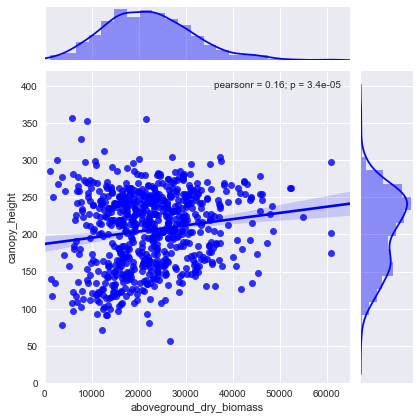

In [39]:
import seaborn as sns
sns.set(style="darkgrid")
g = sns.jointplot("aboveground_dry_biomass", "canopy_height", data=plotdf,
                  kind="reg", truncate=False,
                  xlim=(0, 65000), ylim=(0, 420),
                  color="b")

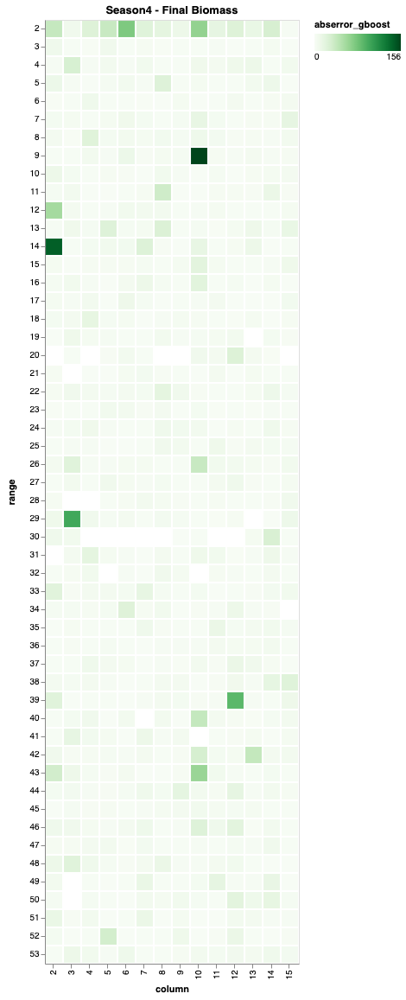

In [60]:
import altair as alt
alt.Chart(plotdf,title='Season4 - Final Biomass').mark_rect().encode(
    x='column:O',
    y='range:O',
    color=alt.Color('abserror_gboost',scale=alt.Scale(scheme='greens')),
    tooltip=[
        alt.Tooltip('aboveground_dry_biomass:Q', title='Final Biomass'),
        alt.Tooltip('abserror_gboost', title='Abs Err %'),
        alt.Tooltip('range',title='range'),
        alt.Tooltip('column',title='column')
    ]
)

In [29]:
alt.Chart(plotdf,title="Histogram of final biomass values").mark_bar().encode(
    alt.X("aboveground_dry_biomass:Q", bin=True),
    y='count()',
)

alt.Chart(...)

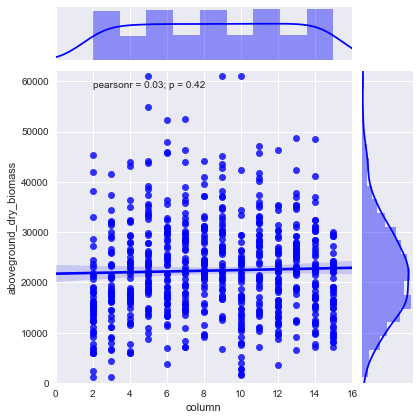

In [37]:
import seaborn as sns
sns.set(style="darkgrid")
g = sns.jointplot("column","aboveground_dry_biomass", data=plotdf,
                  kind="reg", truncate=False,
                  xlim=(0, 16), ylim=(0, 62000),
                  color="b")

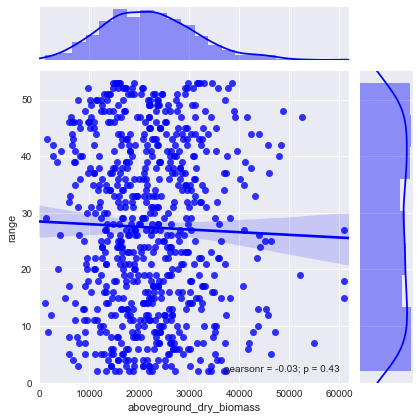

In [40]:
import seaborn as sns
sns.set(style="darkgrid")
g = sns.jointplot("aboveground_dry_biomass", "range",data=plotdf,
                  kind="reg", truncate=False,
                  xlim=(0, 62000), ylim=(0, 55),
                  color="b")

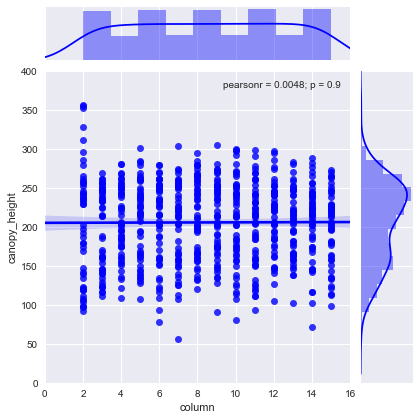

In [41]:
import seaborn as sns
sns.set(style="darkgrid")
g = sns.jointplot("column","canopy_height", data=plotdf,
                  kind="reg", truncate=False,
                  xlim=(0, 16), ylim=(0, 400),
                  color="b")

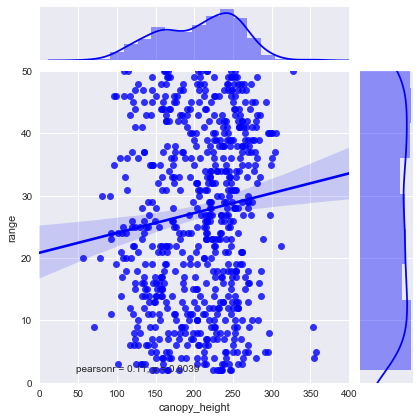

In [42]:
import seaborn as sns
sns.set(style="darkgrid")
g = sns.jointplot("canopy_height","range", data=plotdf,
                  kind="reg", truncate=False,
                  xlim=(0, 400), ylim=(0, 50),
                  color="b")

Here is how to compute the Pearson Correlation between every pair of columns in a dataframe.  It returns a dataframe of dimention (numColumns x numColumns)

In [100]:
plotdf.corr(method='pearson')


,planter_seed_drop,seedling_emergence_rate,emergence_count,canopy_height,canopy_height_diff,leaf_angle_mean,leaf_angle_mean_slope,leaf_angle_chi,leaf_angle_chi_slope,leaf_angle_beta,...,leaf_width,leaf_length,leaf_desiccation_present,aboveground_dry_biomass,range,column,decision_tree,linearRegression,gboost,abserror_gboost
planter_seed_drop,1.000000,0.045950,0.142685,0.064312,-0.023339,-0.057587,-0.034896,0.047361,0.026538,0.021423,...,-0.062117,-0.096022,0.032033,0.060185,-0.005391,0.113726,0.074136,0.192276,0.064746,0.006341
seedling_emergence_rate,0.045950,1.000000,0.869193,-0.004030,0.071852,-0.011441,-0.029026,0.011857,0.028906,-0.011184,...,0.042982,0.012513,-0.003464,-0.000637,0.021485,-0.068087,0.052462,-0.002034,-0.000214,-0.013190
emergence_count,0.142685,0.869193,1.000000,0.004353,0.049357,-0.028704,-0.028913,0.030403,0.028652,-0.016756,...,0.014745,-0.059524,0.036126,0.012712,-0.011286,-0.016242,0.043838,0.040611,0.013215,-0.011351
canopy_height,0.064312,-0.004030,0.004353,1.000000,-0.232773,0.064440,0.171080,-0.053984,-0.173426,-0.071672,...,0.021918,-0.017338,0.068837,0.155752,0.108764,0.004787,0.259592,0.497589,0.169041,0.074869
canopy_height_diff,-0.023339,0.071852,0.049357,-0.232773,1.000000,0.004630,-0.020669,0.007269,0.025300,-0.035057,...,0.022459,-0.058347,-0.018783,0.009844,-0.031756,0.019614,0.010733,0.031448,0.008355,0.056243
leaf_angle_mean,-0.057587,-0.011441,-0.028704,0.064440,0.004630,1.000000,0.228020,-0.954833,-0.271030,-0.632988,...,0.015711,-0.002100,-0.022173,0.011295,0.144761,-0.030824,0.045216,0.036085,0.012500,-0.053154
leaf_angle_mean_slope,-0.034896,-0.029026,-0.028913,0.171080,-0.020669,0.228020,1.000000,-0.260241,-0.969890,0.037355,...,0.042498,0.021259,-0.005042,-0.008785,-0.084123,0.069790,-0.013812,-0.028067,-0.009703,0.030282
leaf_angle_chi,0.047361,0.011857,0.030403,-0.053984,0.007269,-0.954833,-0.260241,1.000000,0.328784,0.455155,...,-0.024904,-0.009598,-0.000932,-0.021146,-0.161160,-0.004883,-0.051578,-0.067557,-0.022928,0.040502
leaf_angle_chi_slope,0.026538,0.028906,0.028652,-0.173426,0.025300,-0.271030,-0.969890,0.328784,1.000000,-0.054828,...,-0.045694,-0.032527,-0.016820,-0.007546,0.062547,-0.106373,-0.015340,-0.024109,-0.008539,-0.025982
leaf_angle_beta,0.021423,-0.011184,-0.016756,-0.071672,-0.035057,-0.632988,0.037355,0.455155,-0.054828,1.000000,...,0.027625,0.059106,0.052335,-0.065972,-0.004111,0.069939,-0.098188,-0.210763,-0.070780,0.100272


In [102]:
corrmat = plotdf.corr()
corrmat.style.background_gradient(cmap='coolwarm')


,planter_seed_drop,seedling_emergence_rate,emergence_count,canopy_height,canopy_height_diff,leaf_angle_mean,leaf_angle_mean_slope,leaf_angle_chi,leaf_angle_chi_slope,leaf_angle_beta,leaf_angle_beta_slope,leaf_angle_alpha,leaf_angle_alpha_slope,plant_basal_tiller_number,stem_elongated_internodes_number_slope,canopy_cover,stand_count,stalk_diameter_minor_axis,stalk_diameter_major_axis,leaf_width,leaf_length,leaf_desiccation_present,aboveground_dry_biomass,range,column,decision_tree,linearRegression,gboost,abserror_gboost
planter_seed_drop,1,0.0459499,0.142685,0.0643123,-0.0233394,-0.0575874,-0.0348955,0.0473608,0.0265383,0.0214231,-0.00278914,0.0477918,0.0238592,-0.0062985,-0.0111123,-0.0656036,0.25388,-0.0235506,-0.0499761,-0.0621168,-0.0960219,0.0320335,0.0601849,-0.00539083,0.113726,0.0741358,0.192276,0.0647461,0.00634091
seedling_emergence_rate,0.0459499,1,0.869193,-0.00403019,0.0718519,-0.011441,-0.0290257,0.0118568,0.0289062,-0.0111845,0.0479627,-0.00321763,0.0373309,-0.126702,-0.0425542,0.0962031,0.147347,0.0178188,-0.0628808,0.0429818,0.012513,-0.00346361,-0.000636525,0.0214854,-0.0680874,0.0524617,-0.00203354,-0.000214076,-0.0131903
emergence_count,0.142685,0.869193,1,0.00435265,0.0493574,-0.0287045,-0.0289126,0.0304026,0.0286521,-0.0167558,0.0330959,0.00167117,0.0368665,-0.163996,-0.022405,0.0630507,0.146927,0.0316019,-0.0667227,0.0147445,-0.0595241,0.0361265,0.0127118,-0.0112857,-0.0162424,0.0438377,0.040611,0.0132151,-0.0113514
canopy_height,0.0643123,-0.00403019,0.00435265,1,-0.232773,0.0644401,0.17108,-0.0539837,-0.173426,-0.071672,-0.072671,-0.0667595,-0.14147,-0.0154326,0.0108374,0.12362,-0.0834067,0.0228767,0.0161995,0.0219176,-0.0173383,0.0688368,0.155752,0.108764,0.00478713,0.259592,0.497589,0.169041,0.0748685
canopy_height_diff,-0.0233394,0.0718519,0.0493574,-0.232773,1,0.0046304,-0.0206688,0.0072692,0.0253,-0.0350566,0.0142624,-0.0206691,0.0274478,0.0489608,0.06259,-0.0374618,0.00913785,0.00869733,-0.0478476,0.0224587,-0.0583467,-0.0187827,0.00984369,-0.0317563,0.0196137,0.0107326,0.0314481,0.00835522,0.0562425
leaf_angle_mean,-0.0575874,-0.011441,-0.0287045,0.0644401,0.0046304,1,0.22802,-0.954833,-0.27103,-0.632988,-0.142325,-0.901484,-0.195303,-0.0138747,0.0290694,0.00316915,0.0123218,-0.0145738,-0.0484039,0.0157114,-0.00209973,-0.0221727,0.011295,0.144761,-0.0308241,0.0452157,0.0360846,0.0125004,-0.0531543
leaf_angle_mean_slope,-0.0348955,-0.0290257,-0.0289126,0.17108,-0.0206688,0.22802,1,-0.260241,-0.96989,0.037355,-0.683524,-0.0986974,-0.915628,0.00258613,0.0345798,-0.0177451,-0.111571,0.0206569,0.0121383,0.0424984,0.0212591,-0.0050425,-0.00878527,-0.0841226,0.0697904,-0.0138124,-0.0280667,-0.00970318,0.0302825
leaf_angle_chi,0.0473608,0.0118568,0.0304026,-0.0539837,0.0072692,-0.954833,-0.260241,1,0.328784,0.455155,0.10265,0.814575,0.203951,0.0156275,-0.0206494,-0.0121812,0.00875743,0.023967,0.0455068,-0.0249038,-0.0095978,-0.000932106,-0.0211462,-0.16116,-0.00488259,-0.0515778,-0.0675569,-0.0229278,0.0405018
leaf_angle_chi_slope,0.0265383,0.0289062,0.0286521,-0.173426,0.0253,-0.27103,-0.96989,0.328784,1,-0.0548277,0.548689,0.126724,0.850473,-0.00284549,-0.025222,0.0133844,0.131383,-0.0151986,-0.0113117,-0.0456941,-0.0325274,-0.0168197,-0.00754629,0.0625468,-0.106373,-0.0153403,-0.0241085,-0.00853936,-0.0259817
leaf_angle_beta,0.0214231,-0.0111845,-0.0167558,-0.071672,-0.0350566,-0.632988,0.037355,0.455155,-0.0548277,1,0.1395,0.868594,0.0547263,-0.00632483,-0.0337411,0.0353896,0.0344882,-0.0202446,0.0451171,0.0276246,0.0591064,0.0523348,-0.0659717,-0.00411101,0.0699388,-0.0981881,-0.210763,-0.0707802,0.100272


I found a technique here (https://towardsdatascience.com/altair-plot-deconstruction-visualizing-the-correlation-structure-of-weather-data-38fb5668c5b1) for unrolling the correlation matrix and renaming its columns to be compatible with vega-lite:


In [107]:
corrmat = plotdf.corr().stack().reset_index().rename(columns={0: 'correlation', 'level_0': 'variable', 'level_1': 'variable2'})
corrmat.head()


,variable,variable2,correlation
0,planter_seed_drop,planter_seed_drop,1.000000
1,planter_seed_drop,seedling_emergence_rate,0.045950
2,planter_seed_drop,emergence_count,0.142685
3,planter_seed_drop,canopy_height,0.064312
4,planter_seed_drop,canopy_height_diff,-0.023339


In [113]:
import altair as alt
alt.Chart(corrmat,title='S4 July 1: correlation of engineered features').mark_rect().encode(
    x='variable2:O',
    y='variable:O',
    color=alt.Color('correlation',scale=alt.Scale(scheme='blueorange')),
    tooltip=[
        alt.Tooltip('correlation:Q', title='Correlation'),
        alt.Tooltip('variable'),
        alt.Tooltip('variable2')
    ]
)

alt.Chart(...)

In [44]:
# look for the features most correlated with canopy_height:  leaf_angle_mean_slope and biomass
plotdf.corr(method='pearson')['canopy_height'].sort_values(ascending=False)[:10]


canopy_height               1.000000
linearRegression            0.497589
decision_tree               0.259592
leaf_angle_mean_slope       0.171080
gboost                      0.169041
aboveground_dry_biomass     0.155752
canopy_cover                0.123620
range                       0.108764
abserror_gboost             0.074869
leaf_desiccation_present    0.068837
Name: canopy_height, dtype: float64

In [45]:
# look for the features most correlated with canopy_height:  leaf_angle_mean_slope and biomass
plotdf.corr(method='pearson')['aboveground_dry_biomass'].sort_values(ascending=False)[:10]


aboveground_dry_biomass                   1.000000
gboost                                    0.992640
decision_tree                             0.644236
linearRegression                          0.313013
canopy_height                             0.155752
stalk_diameter_minor_axis                 0.121776
stalk_diameter_major_axis                 0.120870
canopy_cover                              0.112504
stem_elongated_internodes_number_slope    0.074044
leaf_angle_beta_slope                     0.070265
Name: aboveground_dry_biomass, dtype: float64

In [46]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn import svm
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler
#import xgboost


scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)


tree = DecisionTreeRegressor(max_depth=8).fit(X_train, y_train)
linear_reg = LinearRegression().fit(X_train, y_train)
#svm_mod = svm.SVR().fit(X_train, y_train)
gbr_mod = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=8, random_state=0, loss='ls').fit(X_train, y_train)

pred_tree = tree.predict(X_train)
pred_lr = linear_reg.predict(X_train)
#pred_svm = svm_mod.predict(X_train)
pred_gbr = gbr_mod.predict(X_train)


In [47]:
result = train_df
result['aboveground_dry_biomass'] = drop_target_na['aboveground_dry_biomass']
result['range'] = drop_target_na['range']
result['column'] = drop_target_na['column']
result['decision_tree'] = pred_tree
result['linearRegression'] = pred_lr
#cdf['svm'] = pred_svm
result['gboost'] = pred_gbr
result.head()

,planter_seed_drop,seedling_emergence_rate,emergence_count,canopy_height,canopy_height_diff,leaf_angle_mean,leaf_angle_mean_slope,leaf_angle_chi,leaf_angle_chi_slope,leaf_angle_beta,...,leaf_width,leaf_length,leaf_desiccation_present,aboveground_dry_biomass,range,column,decision_tree,linearRegression,gboost,abserror_gboost
0,73.0,0.813284,56.501741,166.0,11.083333,0.389411,-0.000311,2.040691,0.004837,1.817470,...,69.324206,781.118581,0.0,15460.0,8,8,21105.886598,23000.731755,16379.739671,5.949157
1,76.0,0.813284,56.501741,207.0,11.083333,0.362101,0.000214,2.109844,0.002102,2.343672,...,69.324206,781.118581,0.0,34810.0,8,9,23709.032258,20607.887347,33844.413123,2.773878
2,54.0,0.376500,19.000000,181.0,4.083333,0.395454,-0.000399,1.977792,0.003042,1.978002,...,69.324206,781.118581,0.0,7531.0,8,10,8472.000000,19803.294375,8212.115896,9.044163
3,61.0,0.813284,56.501741,174.0,15.500000,0.421522,0.000214,1.900032,0.002102,1.864959,...,69.324206,781.118581,0.2,25720.0,8,12,26347.269663,23163.133671,26086.735611,1.425877
4,35.5,0.813284,56.501741,126.0,15.500000,0.402537,0.000714,1.937274,-0.002640,2.110941,...,66.500000,786.666667,0.0,18450.0,9,3,20014.166667,11992.636777,18312.627005,0.744569


In [48]:
plotdf = result
# calculate the percentage error between the actual and the model
plotdf['abserror_gboost'] = 100.0*abs(plotdf['aboveground_dry_biomass']-plotdf['gboost'])/plotdf['aboveground_dry_biomass']
plotdf.head()

,planter_seed_drop,seedling_emergence_rate,emergence_count,canopy_height,canopy_height_diff,leaf_angle_mean,leaf_angle_mean_slope,leaf_angle_chi,leaf_angle_chi_slope,leaf_angle_beta,...,leaf_width,leaf_length,leaf_desiccation_present,aboveground_dry_biomass,range,column,decision_tree,linearRegression,gboost,abserror_gboost
0,73.0,0.813284,56.501741,166.0,11.083333,0.389411,-0.000311,2.040691,0.004837,1.817470,...,69.324206,781.118581,0.0,15460.0,8,8,21105.886598,23000.731755,16379.739671,5.949157
1,76.0,0.813284,56.501741,207.0,11.083333,0.362101,0.000214,2.109844,0.002102,2.343672,...,69.324206,781.118581,0.0,34810.0,8,9,23709.032258,20607.887347,33844.413123,2.773878
2,54.0,0.376500,19.000000,181.0,4.083333,0.395454,-0.000399,1.977792,0.003042,1.978002,...,69.324206,781.118581,0.0,7531.0,8,10,8472.000000,19803.294375,8212.115896,9.044163
3,61.0,0.813284,56.501741,174.0,15.500000,0.421522,0.000214,1.900032,0.002102,1.864959,...,69.324206,781.118581,0.2,25720.0,8,12,26347.269663,23163.133671,26086.735611,1.425877
4,35.5,0.813284,56.501741,126.0,15.500000,0.402537,0.000714,1.937274,-0.002640,2.110941,...,66.500000,786.666667,0.0,18450.0,9,3,20014.166667,11992.636777,18312.627005,0.744569


Here is the error plot for the outcome of fitting the model using the 17 variables we engineered 

In [30]:
import altair as alt
alt.Chart(plotdf,title='S4 July 1: Error for engineered feature model').mark_rect().encode(
    x='column:O',
    y='range:O',
    color=alt.Color('abserror_gboost',scale=alt.Scale(scheme='greens')),
    tooltip=[
        alt.Tooltip('aboveground_dry_biomass:Q', title='Final Biomass'),
        alt.Tooltip('abserror_gboost', title='Abs Err %'),
        alt.Tooltip('range',title='range'),
        alt.Tooltip('column',title='column')
    ]
)

alt.Chart(...)

Overall, the model fits the majority of cultivar locations well.  There are a few places, where it fails spectacularly.  Let's mask off the outliers to see what the remainder looks like, when we limit error to bins < 50cm

In [54]:
closer_predicts = plotdf.loc[plotdf['abserror_gboost']<50.0]
print("total number of measurements:",plotdf.shape[0])
print("remaining measurements after outlier removal:",closer_predicts.shape[0])

total number of measurements: 703
remaining measurements after outlier removal: 695


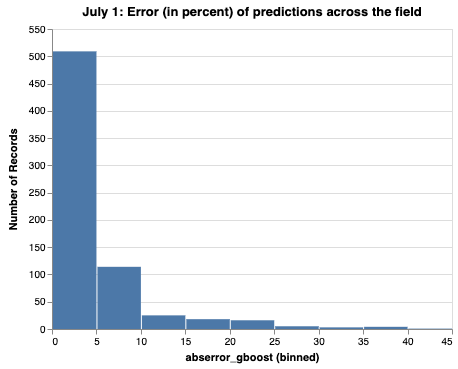

In [55]:
alt.Chart(closer_predicts,title="July 1: Error (in percent) of predictions across the field").mark_bar().encode(
    alt.X("abserror_gboost:Q", bin=True),
    y='count()',
)

How good is this model, based on engineered features, in predicting final biomass?  Is is lower in error than the actual single model trained on the whole field, which was ~ 8% avg. error?

In [56]:
closer_predicts['abserror_gboost'].mean()

4.597212237527741

Let's look at the importance of different features toward making the decision in the XGBoost model.  This model produces this result after it it trained:

In [57]:
for name, importance in zip(train_df.columns, gbr_mod.feature_importances_):
        print(name, "=", importance)

planter_seed_drop = 0.06586672338458194
seedling_emergence_rate = 0.01358957456685752
emergence_count = 0.007687726588838667
canopy_height = 0.11380006196499697
canopy_height_diff = 0.022229670730629834
leaf_angle_mean = 0.07151800578834944
leaf_angle_mean_slope = 0.05819111224490386
leaf_angle_chi = 0.08894142106543593
leaf_angle_chi_slope = 0.06096191424765229
leaf_angle_beta = 0.09518100676193261
leaf_angle_beta_slope = 0.10650300594819663
leaf_angle_alpha = 0.08761930649041276
leaf_angle_alpha_slope = 0.08476522178198678
plant_basal_tiller_number = 0.0005156049802102396
stem_elongated_internodes_number_slope = 0.0013952253952124246
canopy_cover = 0.01852121145893832
stand_count = 0.07531310824630695
stalk_diameter_minor_axis = 0.00859425322237435
stalk_diameter_major_axis = 0.0008166270927388629
leaf_width = 0.00496012761503822
leaf_length = 0.001444180828653875
leaf_desiccation_present = 0.01158490959575153


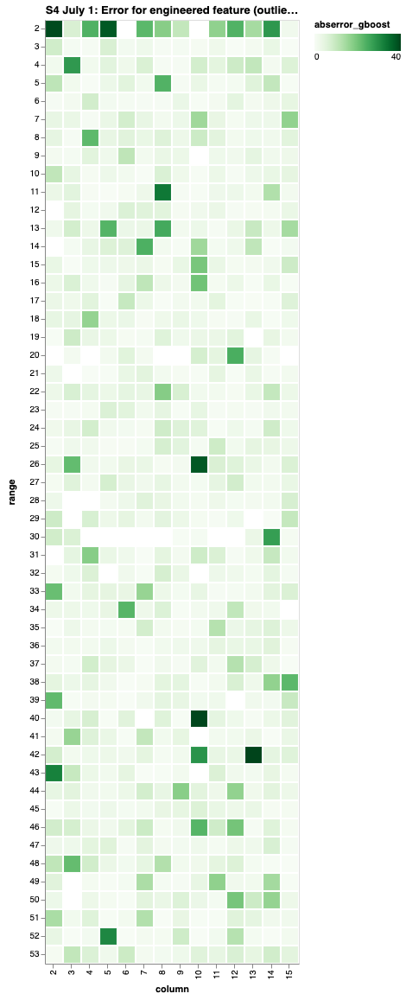

In [59]:
import altair as alt
alt.Chart(closer_predicts,title='S4 July 1: Error for engineered feature (outliers removed)').mark_rect().encode(
    x='column:O',
    y='range:O',
    color=alt.Color('abserror_gboost',scale=alt.Scale(scheme='greens')),
    tooltip=[
        alt.Tooltip('aboveground_dry_biomass:Q', title='Final Biomass'),
        alt.Tooltip('abserror_gboost', title='Abs Err %'),
        alt.Tooltip('range',title='range'),
        alt.Tooltip('column',title='column')
    ]
)

## explainability of July model
Run SHAP analysis on July predictions model, made in cell #17

In [25]:
import xgboost
import shap

# load JS visualization code to notebook
shap.initjs()


# train XGBoost model
model = xgboost.train({"learning_rate": 0.01}, xgboost.DMatrix(train_df, label=target_df), 100)

# explain the model's predictions using SHAP values
# (same syntax works for LightGBM, CatBoost, scikit-learn and spark models)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(train_df)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[0,:], train_df.iloc[0,:])

In [27]:
# load JS visualization code to notebook
shap.initjs()


# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[75,:], train_df.iloc[75,:])

In [28]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, train_df)

### prepare and write out July dataset for use in interactive visualizations

Ryan's July dataset has interesting engineered features, so it will enrich the exploration experience.  However, it is missing cultivar (intentionally), so we need to put cultivar back on in order to be able to render and pivot by cultivar in the interactive interface. We will load the season4 dataset in and use it as a cross reference between position and cultivar. 

In [38]:
plotdf.head()

,planter_seed_drop,seedling_emergence_rate,emergence_count,canopy_height,canopy_height_diff,leaf_angle_mean,leaf_angle_mean_slope,leaf_angle_chi,leaf_angle_chi_slope,leaf_angle_beta,...,leaf_width,leaf_length,leaf_desiccation_present,aboveground_dry_biomass,range,column,decision_tree,linearRegression,gboost,abserror_gboost
0,73.0,0.813284,56.501741,166.0,11.083333,0.389411,-0.000311,2.040691,0.004837,1.817470,...,69.324206,781.118581,0.0,15460.0,8,8,21105.886598,23000.731755,16379.739671,5.949157
1,76.0,0.813284,56.501741,207.0,11.083333,0.362101,0.000214,2.109844,0.002102,2.343672,...,69.324206,781.118581,0.0,34810.0,8,9,23709.032258,20607.887347,33844.413123,2.773878
2,54.0,0.376500,19.000000,181.0,4.083333,0.395454,-0.000399,1.977792,0.003042,1.978002,...,69.324206,781.118581,0.0,7531.0,8,10,8472.000000,19803.294375,8212.115896,9.044163
3,61.0,0.813284,56.501741,174.0,15.500000,0.421522,0.000214,1.900032,0.002102,1.864959,...,69.324206,781.118581,0.2,25720.0,8,12,26347.269663,23163.133671,26086.735611,1.425877
4,35.5,0.813284,56.501741,126.0,15.500000,0.402537,0.000714,1.937274,-0.002640,2.110941,...,66.500000,786.666667,0.0,18450.0,9,3,20014.166667,11992.636777,18312.627005,0.744569


In [39]:
plotdf.shape

(703, 29)

In [40]:
season4 = pd.read_csv('s4_height_and_models.csv')

In [51]:
for index, row in plotdf.iterrows():
    #find a matching cultivar for this range,column
    # and 
    matchingRecords = season4.loc[(season4['range']==row['range']) & (season4['column']==row['column']) ]
    print(matchingRecords.iloc[0]['cultivar'])
    break
    

PI570145


In [65]:
goodcount = 0
cultivarList = []
cultivar_df = pd.DataFrame(columns=['cultivar'])
for index, row in plotdf.iterrows():
    #find a matching cultivar for this range,column
    # and 
    matchingRecords = season4.loc[(season4['range']==int(row['range'])) & (season4['column']==int(row['column'])) ]
    # pull out the first matching cultivar name
    try:
        matchingCultivar = matchingRecords.iloc[0]['cultivar']
        #print(matchingCultivar)
        goodcount += 1
        cultivarList.append({'cultivar': matchingCultivar})
    except:
        print(row['range'],row['column'])
        cultivarList.append({'cultivar':'Unmatched'})
print('found matches for ',goodcount, ' of ',plotdf.shape[0],'records')
    #row['cultivar'] = matchingCultivar
cultivar_df = pd.DataFrame(cultivarList)
plotdf['cultivar'] = cultivar_df['cultivar']

14.0 12.0
15.0 9.0
53.0 6.0
2.0 4.0
2.0 7.0
2.0 8.0
2.0 11.0
5.0 6.0
20.0 7.0
53.0 5.0
53.0 7.0
53.0 8.0
53.0 10.0
53.0 11.0
53.0 12.0
53.0 14.0
53.0 15.0
2.0 2.0
2.0 3.0
2.0 5.0
2.0 6.0
2.0 9.0
2.0 10.0
2.0 12.0
2.0 13.0
found matches for  678  of  703 records


In [66]:
plotdf.head()


,planter_seed_drop,seedling_emergence_rate,emergence_count,canopy_height,canopy_height_diff,leaf_angle_mean,leaf_angle_mean_slope,leaf_angle_chi,leaf_angle_chi_slope,leaf_angle_beta,...,leaf_length,leaf_desiccation_present,aboveground_dry_biomass,range,column,decision_tree,linearRegression,gboost,abserror_gboost,cultivar
0,73.0,0.813284,56.501741,166.0,11.083333,0.389411,-0.000311,2.040691,0.004837,1.817470,...,781.118581,0.0,15460.0,8,8,21105.886598,23000.731755,16379.739671,5.949157,PI570145
1,76.0,0.813284,56.501741,207.0,11.083333,0.362101,0.000214,2.109844,0.002102,2.343672,...,781.118581,0.0,34810.0,8,9,23709.032258,20607.887347,33844.413123,2.773878,PI329510
2,54.0,0.376500,19.000000,181.0,4.083333,0.395454,-0.000399,1.977792,0.003042,1.978002,...,781.118581,0.0,7531.0,8,10,8472.000000,19803.294375,8212.115896,9.044163,PI510757
3,61.0,0.813284,56.501741,174.0,15.500000,0.421522,0.000214,1.900032,0.002102,1.864959,...,781.118581,0.2,25720.0,8,12,26347.269663,23163.133671,26086.735611,1.425877,PI329865
4,35.5,0.813284,56.501741,126.0,15.500000,0.402537,0.000714,1.937274,-0.002640,2.110941,...,786.666667,0.0,18450.0,9,3,20014.166667,11992.636777,18312.627005,0.744569,PI569457


In [67]:
plotdf.to_csv('s4july_traits_and_models.csv',index=False)